# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Data Task
Build a model to predict a car price. Investigate and interpret the model's coefficients. Based on findings provide a human-readable model description with an explanation of the most impactful car features.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

#### Date investigation plan
1. Load dataset and review available features
2. Identify features that would be useful for our model and features that we can drop.
3. Review data gaps for each feature and try to fill the gaps where it is possible. Drop features where we are not able to fill the gaps. 
4. Review data types and cast to numeric or date types where it is possible.
5. Check data correlation and plot data.
6. Analyze the final data set and do a data transformation or engineer new features for our model if needed.
7. Build a model.

In [726]:
import pandas as pd

cars_df = pd.read_csv('data/vehicles.csv')
cars_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [727]:
cars_df.head(5)

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


#### Data quality
We have 4 non-null columns in our dataset (id, region, price, state). Other columns have data gaps and we need to fix them.

We also have 2 columns with unique values like id and VIN. They are not useful for our model.

Columns region and state are quite similar after further investigation we might keep only 1 column for our purpose.

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

#### Data cleaning

In [728]:
# check VIN and ID duplicates
vin_duplicates = cars_df['VIN'].dropna().duplicated().sum()
id_duplicates = cars_df['id'].duplicated().sum()
print(f'VIN duplicates: {vin_duplicates}')
print(f'ID duplicates: {id_duplicates}')

VIN duplicates: 147592
ID duplicates: 0


We can see that many cars appeared on our dataset multiple times. However, each row has a different id. It means we may have some sales records that were added twice or it might be that the same car was sold multiple times throughout its lifetime. 

In [729]:
# verify how many row duplicates we have if we eliminate the ID column
dulpicaates = cars_df.drop(columns=['id']).duplicated().sum()
print(f'Row duplicates: {dulpicaates}')

Row duplicates: 56202


Keeping in mind that many VIN rows have missing values we can conclude that our data has a lot of duplicated information 

In [730]:
# Drop id, VIN and state columns in cars_df dataframe
cars_df.drop(columns=['id', 'VIN', 'state'], inplace=True)

In [731]:
# remove duplicates
cars_df.drop_duplicates(inplace=True)

In [732]:
# Drop region columns in cars_df dataframe since it is not useful for analysis because it is overlap with state column
cars_df.drop(columns=['region'], inplace=True)
cars_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 370006 entries, 0 to 426879
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   price         370006 non-null  int64  
 1   year          369020 non-null  float64
 2   manufacturer  354808 non-null  object 
 3   model         365330 non-null  object 
 4   condition     228959 non-null  object 
 5   cylinders     219518 non-null  object 
 6   fuel          367569 non-null  object 
 7   odometer      366560 non-null  float64
 8   title_status  363310 non-null  object 
 9   transmission  367970 non-null  object 
 10  drive         257738 non-null  object 
 11  size          105665 non-null  object 
 12  type          291224 non-null  object 
 13  paint_color   261424 non-null  object 
dtypes: float64(2), int64(1), object(11)
memory usage: 42.3+ MB


In [733]:
# Fill the gaps for transmission column
cars_df['transmission'].value_counts()

transmission
automatic    284336
other         61048
manual        22586
Name: count, dtype: int64

In [734]:
cars_df['transmission'].fillna('automatic', inplace=True)

In [735]:
# Fill the gaps for fuel column
cars_df['fuel'].value_counts()

fuel
gas         307303
other        28135
diesel       25867
hybrid        4673
electric      1591
Name: count, dtype: int64

In [736]:
cars_df['fuel'].fillna('gas', inplace=True)

In [737]:
# Fill the gaps for title_status column
cars_df['title_status'].value_counts()

title_status
clean         350708
rebuilt         6696
salvage         3535
lien            1397
missing          782
parts only       192
Name: count, dtype: int64

In [738]:
cars_df['title_status'].fillna('clean', inplace=True)

In [739]:
# Fix the gaps for year column
cars_df['year'].isnull().mean()

0.0026648216515407857

In [740]:
# drop rows with missing year values since it is a small percentage
cars_df.dropna(subset=['year'], inplace=True)

In [741]:
# Fix the gaps for size column
cars_df['size'].isnull().mean()

0.7136605062056257

In [742]:
# drop size column since it has a high percentage of missing values
cars_df.drop(columns=['size'], inplace=True)

In [743]:
# Fill the gaps for condition column
cars_df['condition'].value_counts()

condition
good         116256
excellent     86133
like new      18278
fair           6592
new            1111
salvage         581
Name: count, dtype: int64

In [744]:
cars_df['condition'].fillna('good', inplace=True)

In [745]:
# Fix the gaps for cylinders column
cars_df['cylinders'].isnull().mean()

0.4076039239065633

In [746]:
# drop cylinders column since it has a high percentage of missing values
cars_df.drop(columns=['cylinders'], inplace=True)

In [747]:
# Fix the gaps for paint_color column
cars_df['paint_color'].value_counts()

paint_color
white     69848
black     55297
silver    37431
blue      27433
red       27047
grey      20984
green      6552
brown      5876
custom     5760
yellow     1948
orange     1771
purple      610
Name: count, dtype: int64

In [748]:
# fill paint_color column with the value 'other' for missing values 
# since we might have a lot of colors and we don't expect to see this 
# feature as a significant feature in our analysis
cars_df['paint_color'].fillna('other', inplace=True)

In [749]:
# Fill manufacturer column based on model column where model column has a value and manufacturer column is missing
cars_df[(cars_df['manufacturer'].isnull) and (cars_df['model'].isnull())].shape[0], cars_df[(cars_df['manufacturer'].isnull())].shape[0]

(4619, 14217)

In [750]:
# drop rows where both manufacturer and model columns are missing
cars_df.dropna(subset=['manufacturer', 'model'], inplace=True)

In [751]:
# cast year column to integer
cars_df['year'] = cars_df['year'].astype(int)

In [752]:
# fill missing odometer values based on the mean odometer value 
# for each year
cars_df['odometer'] = cars_df.groupby('year')['odometer'].transform(lambda x: x.fillna(x.mean()))

In [753]:
# drop na odometer values and cast odometer column to integer
cars_df.dropna(subset=['odometer'], inplace=True)
cars_df['odometer'] = cars_df['odometer'].astype(int)

In [754]:
# drop drive column since it has a high percentage of missing values
cars_df.drop(columns=['drive'], inplace=True)

In [755]:
# drop missing values in model and manufacturer column
cars_df.dropna(subset=['model', 'manufacturer'], inplace=True)

In [756]:
# drop type column since it has a high percentage of missing values 
# and we will use manufacturer and model columns for analysis instead
cars_df.drop(columns=['type'], inplace=True)

In [757]:
# cast all object columns to categroy type
for col in cars_df.select_dtypes(include='object').columns:
    cars_df[col] = cars_df[col].astype('category')

array([[<Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'year'}>],
       [<Axes: title={'center': 'odometer'}>, <Axes: >]], dtype=object)

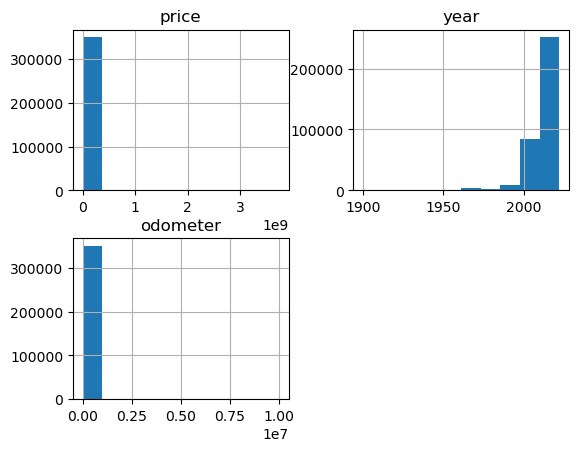

In [758]:
# plot cars_df dataframe
cars_df.hist()

Based on this plot we can conclude that all 3 columns have outliers.

Text(0, 0.5, 'Odometer')

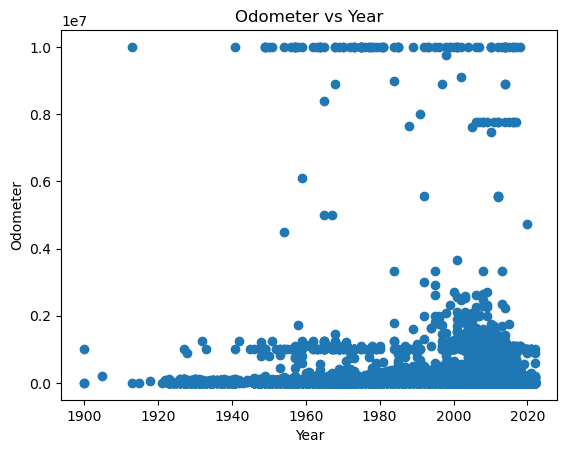

In [759]:
# plot odometer and year columns
import matplotlib.pyplot as plt

plt.scatter(cars_df['year'], cars_df['odometer'])
plt.title('Odometer vs Year')
plt.xlabel('Year')
plt.ylabel('Odometer')

Here we see some outliers for 'odometer' column just a few examples where year < 1920. Let's remove these values as outliers and keep our model more balanced.

In [760]:
# remove outliers in odometer column
cars_df = cars_df[cars_df['odometer'] < 999999]
# remove outliers in year column
cars_df = cars_df[cars_df['year'] > 1920]

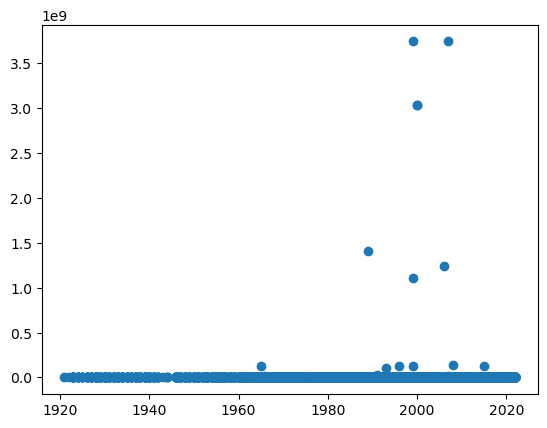

In [761]:
# review price data
plt.scatter(cars_df['year'], cars_df['price'])

Text(0, 0.5, 'Price')

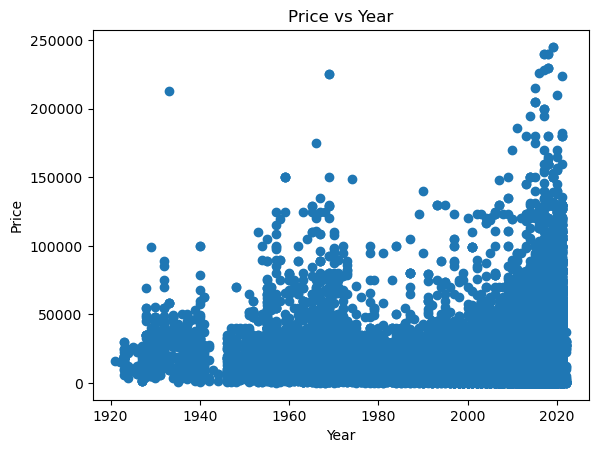

In [762]:
# remove outliers in price column
# all cars above 250k and below 100 are considered outliers
cars_df = cars_df[(cars_df['price'] < 250_000) & (cars_df['price'] > 100)]
plt.scatter(cars_df['year'], cars_df['price'])
plt.title('Price vs Year')
plt.xlabel('Year')
plt.ylabel('Price')

#### Final data check

In [763]:
cars_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 323561 entries, 27 to 426879
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   price         323561 non-null  int64   
 1   year          323561 non-null  int64   
 2   manufacturer  323561 non-null  category
 3   model         323561 non-null  category
 4   condition     323561 non-null  category
 5   fuel          323561 non-null  category
 6   odometer      323561 non-null  int64   
 7   title_status  323561 non-null  category
 8   transmission  323561 non-null  category
 9   paint_color   323561 non-null  category
dtypes: category(7), int64(3)
memory usage: 13.0 MB


In [764]:
cars_df.head()

,price,year,manufacturer,model,condition,fuel,odometer,title_status,transmission,paint_color
27,33590,2014,gmc,sierra 1500 crew cab slt,good,gas,57923,clean,other,white
28,22590,2010,chevrolet,silverado 1500,good,gas,71229,clean,other,blue
29,39590,2020,chevrolet,silverado 1500 crew,good,gas,19160,clean,other,red
30,30990,2017,toyota,tundra double cab sr,good,gas,41124,clean,other,red
31,15000,2013,ford,f-150 xlt,excellent,gas,128000,clean,automatic,black


At this point, we have a clean data set without missing values all columns has numeric or categorical datatype that make it possible to use this values for a modeling. Transformation of all categorical values will be done in modeling part.

# Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

#### Modeling plan:
1. Build a simple model based on ['year', 'odometer'] features and measure its performance
2. Build a model that uses all available columns.

## 1. Model based only on year and odometer features.

In [765]:
# separate set of features and target variable
X = cars_df[['odometer', 'year']]
y = cars_df['price']

Text(0.5, 0.98, 'Feature Set Data Distribution')

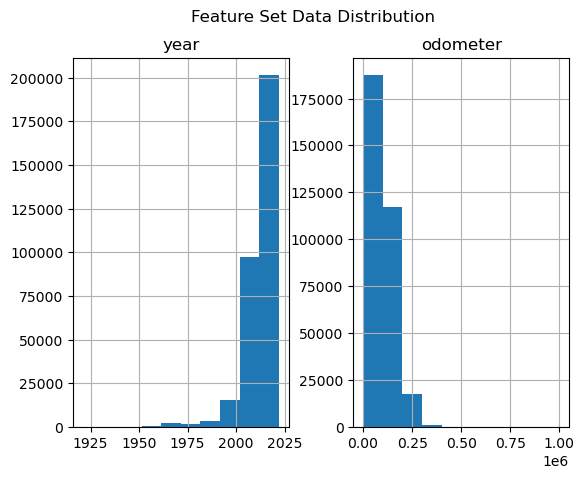

In [785]:
# feature set data distribution
X.hist()
plt.suptitle('Feature Set Data Distribution')

Text(0, 0.5, 'Frequency')

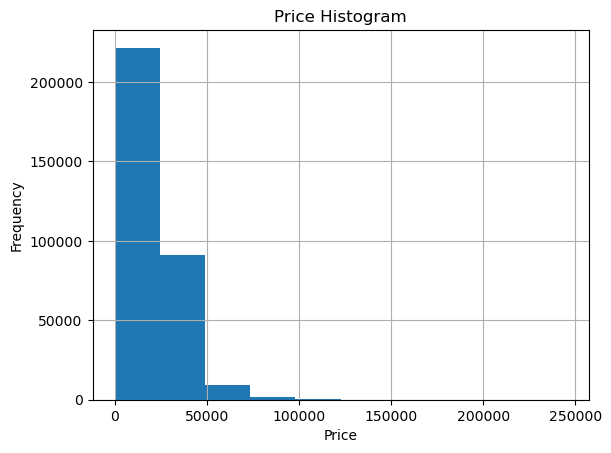

In [784]:
# plot price histogram
y.hist()
plt.title('Price Histogram')
plt.xlabel('Price')
plt.ylabel('Frequency')

Here we can see that price values are skewed to the left. We can apply a log transformation to the price column to make it more normally distributed.

Text(0.5, 1.0, 'Log Price Histogram')

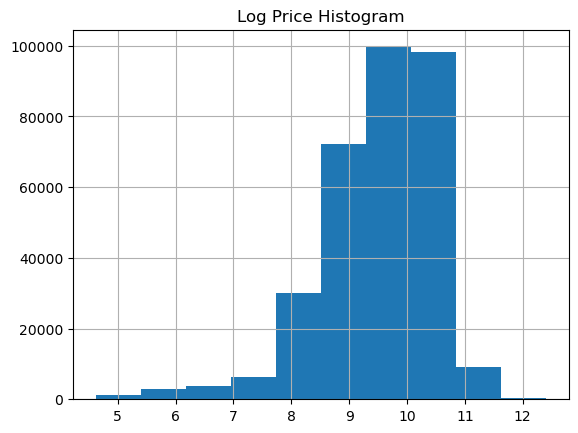

In [767]:
# plot log price histogram 
import numpy as np

y.apply(lambda x: np.log(x)).hist()
plt.title('Log Price Histogram')


In [768]:
# plot 3d scatter plot for year, odometer and log price columns with plotly
import plotly.express as px
# mute the warning
import warnings
warnings.filterwarnings('ignore')

fig = px.scatter_3d(cars_df, x='year', y='odometer', z='price', log_z=True,
                    color='manufacturer', title='3D Scatter Plot for Year, Odometer and Price')
fig.show()

In [769]:
# creta a pipeline to transform the target variable and apply a model
from sklearn.compose import TransformedTargetRegressor
from sklearn.discriminant_analysis import StandardScaler
from sklearn.linear_model import Ridge, Lasso
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures

pipe_1 = Pipeline([
    ('poly', PolynomialFeatures()),
    ('StandardScaler', StandardScaler()),
    ('ttr', TransformedTargetRegressor(Ridge(), func=np.log, inverse_func=np.exp))
])

In [770]:
# build an estimator to compare different hyperparameters
from sklearn.model_selection import GridSearchCV

params_1 = {'poly__degree': range(1, 10),
          'ttr__regressor__alpha': [0, 0.001, 0.01, 0.1, 0.5, 1.0, 10.0, 50, 100],
          'ttr__regressor__fit_intercept': [True, False],
          }

model_1 = GridSearchCV(pipe_1, param_grid=params_1, scoring='neg_mean_squared_error', cv=5)

In [771]:
# fit the model
model_1.fit(X, y)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('poly', PolynomialFeatures()),
                                       ('StandardScaler', StandardScaler()),
                                       ('ttr',
                                        TransformedTargetRegressor(func=<ufunc 'log'>,
                                                                   inverse_func=<ufunc 'exp'>,
                                                                   regressor=Ridge()))]),
             param_grid={'poly__degree': range(1, 10),
                         'ttr__regressor__alpha': [0, 0.001, 0.01, 0.1, 0.5,
                                                   1.0, 10.0, 50, 100],
                         'ttr__regressor__fit_intercept': [True, False]},
             scoring='neg_mean_squared_error')

In [772]:
# get model best parameters and score
print(f'Best parameters: {model_1.best_params_}')
print(f'Best score: {model_1.best_score_}')

Best parameters: {'poly__degree': 9, 'ttr__regressor__alpha': 0.001, 'ttr__regressor__fit_intercept': True}
Best score: -143788040.21864492


In [774]:
# get all model coefficients and feature names
coefs = model_1.best_estimator_.named_steps['ttr'].regressor_.coef_
feature_names = model_1.best_estimator_.named_steps['poly'].get_feature_names_out()
# match coefficients with feature names
coefs_df = pd.DataFrame({'feature': feature_names, 'coef': coefs})
coefs_df.sort_values('coef', ascending=False, inplace=True)
coefs_df.head(10)


,feature,coef
54,year^9,119.088418
2,year,105.903621
52,odometer^2 year^7,101.424900
15,odometer^5,71.895601
3,odometer^2,62.632441
17,odometer^3 year^2,62.515517
24,odometer^3 year^3,61.807875
47,odometer^7 year^2,55.148588
22,odometer^5 year,51.634220
53,odometer year^8,51.192308


Here we can see that we have a significant mean_squared_error: 143788040.22. Based on this performance metric we can conclude that we can't do a proper price estimation based only on 'year' and 'odometer' values.

## 2. Model based on extended feature set

In [775]:
# update feature set - use all available features except 'model'
X = cars_df.drop(columns=['price', 'model'])
y = cars_df['price']

In [673]:
# split the data into training and test set
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [674]:
# create one hot encoder for all category columns
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder

ohe_transformer = make_column_transformer((OneHotEncoder(drop = 'if_binary'), X.select_dtypes(include='category').columns),remainder='passthrough')


In [686]:
# create a pipeline with the encoder
pipe = Pipeline([
    ('transformer', ohe_transformer),
    ('poly', PolynomialFeatures(include_bias=False)),
    ('StandardScaler', StandardScaler(with_mean=False)),
    ('ttr', TransformedTargetRegressor(Ridge(fit_intercept=False), func=np.log, inverse_func=np.exp))
])

In [687]:
params = {'poly__degree': range(1, 4),
          'ttr__regressor__alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 10.0, 50, 100],
          }

full_model = GridSearchCV(pipe, param_grid=params, scoring='neg_mean_squared_error')

In [688]:
# fit the model
full_model.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(drop='if_binary'),
                                                                         Index(['manufacturer', 'condition', 'fuel', 'title_status', 'transmission',
       'paint_color'],
      dtype='object'))])),
                                       ('poly',
                                        PolynomialFeatures(include_bias=False)),
                                       ('StandardScaler',
                                        StandardScaler(with_mean=False)),
                                       ('ttr',
                                        TransformedTargetRegressor(func=<ufunc 'log'>,
                                                                   inverse_func=<ufunc 'exp'>,
                                                                   regressor=Ridge(fit_intercept=False)))]),
             param_grid={'poly__degree': range(1, 4),
                         'ttr__regressor__alpha': [0.001, 0.01, 0.1, 0.5, 1.0,
                                                   10.0, 50, 100]},
             scoring='neg_mean_squared_error')

In [692]:
from sklearn.metrics import mean_squared_error

# get model best parameters and score
print(f'Best parameters: {full_model.best_params_}')
print(f'Best score: {full_model.best_score_}')

# calculate the score on the test set
y_pred = full_model.predict(X_test)
print(f'MSE for Test set: {mean_squared_error(y_test, y_pred)}')

Best parameters: {'poly__degree': 2, 'ttr__regressor__alpha': 100}
Best score: -115711819.83171229
MSE for Test set: 115255172.47465377


In [717]:
# get all model coefficients and feature names
coefs = full_model.best_estimator_.named_steps['ttr'].regressor_.coef_
feature_names = full_model.best_estimator_.named_steps['poly'].get_feature_names_out()
# match coefficients with feature names
feature_coef = pd.DataFrame({'feature': feature_names, 'coef': coefs})
feature_coef.sort_values(by='coef', ascending=False, inplace=True)
feature_coef.head(10)

,feature,coef
2999,x74^2,0.049152
2578,x47 x58,0.020596
74,x74,0.019872
1020,x13 x47,0.018610
2572,x47 x52,0.017815
2594,x47 x74,0.017576
47,x47,0.017440
2567,x47^2,0.017440
2445,x43 x47,0.016933
2595,x47 x75,0.016002


Here we got a model with a better performance however with these amount of features it's very hard to interpret the results to clear guidance for a dealership.

### 2.2 Best feature selection

In [702]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression


pipe_2_2 = Pipeline([
    ('transformer', ohe_transformer),
    ('selector', SequentialFeatureSelector(LinearRegression())),
    ('model', LinearRegression())
])

params_2_2 = {'selector__n_features_to_select': range(1, 10)}

model_2_2 = GridSearchCV(pipe_2_2, param_grid=params_2_2, scoring='neg_mean_squared_error')

In [703]:
# fit the model
model_2_2.fit(X_train, y_train)


GridSearchCV(estimator=Pipeline(steps=[('transformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(drop='if_binary'),
                                                                         Index(['manufacturer', 'condition', 'fuel', 'title_status', 'transmission',
       'paint_color'],
      dtype='object'))])),
                                       ('selector',
                                        SequentialFeatureSelector(estimator=LinearRegression())),
                                       ('model', LinearRegression())]),
             param_grid={'selector__n_features_to_select': range(1, 10)},
             scoring='neg_mean_squared_error')

In [777]:
print(f'Best parameters: {model_2_2.best_params_}')
print(f'Best score: {model_2_2.best_score_}')
# calculate the score on the test set
y_pred = model_2_2.predict(X_test)
print(f'MSE for Test set: {mean_squared_error(y_test, y_pred)}')



Best parameters: {'selector__n_features_to_select': 9}
Best score: -121667713.56152558
MSE for Test set: 125727318.91569938


In [778]:
# print best features selected by model
feature_names = ohe_transformer.get_feature_names_out()[model_2_2.best_estimator_.named_steps["selector"].get_support()]
print(f'Features: {feature_names}')
# get coefficients
coefs = model_2_2.best_estimator_.named_steps['model'].coef_
# match coefs with feature names
coefs_df = pd.DataFrame({'feature': feature_names, 'coef': coefs})
coefs_df.sort_values('coef', ascending=False, inplace=True)
coefs_df.head(10)

Features: ['onehotencoder__manufacturer_gmc' 'onehotencoder__manufacturer_hyundai'
 'onehotencoder__manufacturer_nissan' 'onehotencoder__manufacturer_ram'
 'onehotencoder__fuel_diesel' 'onehotencoder__fuel_other'
 'onehotencoder__title_status_clean' 'remainder__year'
 'remainder__odometer']


,feature,coef
4,onehotencoder__fuel_diesel,18278.443464
3,onehotencoder__manufacturer_ram,7374.157428
0,onehotencoder__manufacturer_gmc,4581.081828
6,onehotencoder__title_status_clean,3611.376597
5,onehotencoder__fuel_other,3560.180062
7,remainder__year,316.837585
8,remainder__odometer,-0.107840
1,onehotencoder__manufacturer_hyundai,-3504.166941
2,onehotencoder__manufacturer_nissan,-4874.242222


### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

With the model 2.2 we have a better MSE score than the model 1. Based on the selected features we can see that the most impactful features are [Manufacturer, year, odometer, status, and fuel]

### Model performance
We have a significant MSE and our model is not suitable for predicting car prices itself, however, we were able to extract the main features that bring the most impact on the car price. 

### Future steps
To improve the model we need to invest time in feature development and data preparation.
1. Restore and utilize the car type that was dropped during the data preparation step. Since we have a wide diversity in a model column we can't use it for our models. At the same time having a car type separation could improve our estimates. It's clear that a smaller car like a regular sedan is cheaper compared to a truck. 
2. It would be nice to have a car sliced by price point like a luxury car, collectibles, and etc
3. Convert the year column from a production year to a value showing how old the car instead
4. Do a more aggressive outlier cut. It may align our model for better use by regular dealerships and improve model performance.
5. Find information about the initial car price (when it was new) - it might be a very hard task at the same time it might bring much better accuracy to our model.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.

# Information for customer
Based on conducted research we can specify the following car features that impact car price:
1. The most impactful feature is 'fuel type - diesel'. The main reason for this is that it's the main engine type for big commercial vehicles. 
2. Some manufacturers are more valuable like RAM and GMC. At the same time some car brands like Hyndai or Nissan impact prices in a negativly. 
3. Another important characteristic is how old is the car - the older the car the cheaper it is. 
4. Odometer value - the higher mileage the cheaper the car.